In [1]:
import findspark
import pandas as pd
import numpy as np

import pyspark as psk
from pyspark import SparkConf, SparkContext
from pyspark.sql import SparkSession
from pyspark.sql.types import *
from pyspark.sql import functions as f
from pyspark.sql import Row
from pyspark.sql.types import StructType, StructField, StringType
from pyspark.sql import DataFrame
from pyspark.sql.functions import *

import time as t 
from datetime import date, datetime, timedelta
from joblib import Parallel, delayed
import multiprocessing
from functools import reduce  
from math import modf
import sqlite3
import os
import sys

from delta import * 
from delta.tables import *
from delta import configure_spark_with_delta_pip
from IPython import get_ipython

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD


findspark.init()
findspark.find()

os.environ['PYSPARK_PYTHON'] = sys.executable
os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable

conf = (SparkConf().set("spark.driver.maxResultSize", "4g"))

# Create new context
sc = SparkContext(conf=conf)


# sc = SparkContext("local", "Simple App")

# Create SparkSession 
spark = SparkSession.builder \
       .master("local[2]") \
       .appName("test") \
       .config("spark.driver.maxResultSize", "20g")\
       .config("spark.driver.memory", "100g")\
       .getOrCreate()

spark.sql("set spark.sql.legacy.timeParserPolicy=LEGACY")    #To resolve the error for p1075_38 to_timestamp formating: You may get a different result due to the upgrading to Spark >= 3.0: Fail to parse '1/2/2019 20:40:00' in the new parser. You can set spark.sql.legacy.timeParserPolicy to LEGACY to restore the behavior before Spark 3.0, or set to CORRECTED and treat it as an invalid datetime string.
spark.read.option("header",True) \
          .csv("/storage/home/yqf5148/work/volvoPennState/PopulationWithChassisId.csv") \
          .createOrReplaceTempView("population")

df_population = spark.sql("SELECT * FROM population")

ps: /storage/icds/RISE/sw8/anaconda/anaconda3/envs/tensorflow/lib/libuuid.so.1: no version information available (required by /usr/lib64/libblkid.so.1)
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/06/20 16:20:46 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
24/06/20 16:20:47 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.
24/06/20 16:20:47 WARN Utils: Service 'SparkUI' could not bind on port 4041. Attempting port 4042.
24/06/20 16:20:56 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


In [2]:
def check_non_empty_string(input_string):
    if not isinstance(input_string, str):
        return False
    
    if input_string.strip() == "":
        return False
    
    return True



def normalize_numeric_feature_values(statement_in_feature_name, df):

  selected_col_names_list = [col for col in df.columns.values if statement_in_feature_name in col]   # selects names of columns that contain specific string

  selected_cols = df[selected_col_names_list]
  # for col_name in selected_col_names_list:
      # selected_cols[col_name] = selected_cols[col_name].str.replace(",",".")
      # selected_cols[col_name] = selected_cols[col_name].apply(lambda x: float(x.split()[0]))
  selected_cols_norm = selected_cols.apply(lambda iterator: ((iterator - iterator.mean())/(iterator.max() - iterator.min())).round(3))

  df[selected_cols_norm.columns] = selected_cols_norm
  return df


'''
Perform z-score normalization by subtracting the mean and dividing by the standard deviation (or the replaced value).

'''
def normalize_sparse_dataframe(df, skip_this_col):
    """
    Normalize a DataFrame with float numeric values, ensuring no NaN values are produced.
    """
    original_df = df
    columns_to_normalize = df.columns
    
    # First exclude this column (if necessary)
    if check_non_empty_string(skip_this_col):
        columns_to_normalize = [col for col in df.columns if skip_this_col not in col]
        df = df[columns_to_normalize]
        
    # Calculate the mean and standard deviation for each column
    mean = df.mean()
    std = df.std()
    
    # Avoid division by zero by setting std deviations of 0 to 1 (no scaling for those columns)
    std_replaced = std.replace(0, 1)
    
    # Perform the normalization
    normalized_df = (df - mean) / std_replaced
    original_df[columns_to_normalize] = normalized_df
    
    return original_df

def parts_replacement_aggregation(a_part_replacement_happened):
    return 1 if (a_part_replacement_happened == 1).any() else 0

In [3]:
calculated_features = [    
          "calendar_day", 
          "f_1_dtc38_1th_15d", 
          "f_1_dtc38_2nd_15d", 
          "f_2_dtc38_1th_15d", 
          "f_2_dtc38_2nd_15d", 
          "f_3_dtc38_1th_15d", 
          "f_3_dtc38_2nd_15d", 
          "f_4_dtc38_1th_15d", 
          "f_4_dtc38_2nd_15d", 
          "f_5_dtc38_1th_15d", 
          "f_5_dtc38_2nd_15d", 
          "f_6_dtc38_1th_15d", 
          "f_6_dtc38_2nd_15d", 
          "f_7_dtc38_1th_15d", 
          "f_7_dtc38_2nd_15d", 
          "f_8_dtc38_1th_15d", 
          "f_8_dtc38_2nd_15d", 

          "f_1_dtc75_1th_15d", 
          "f_1_dtc75_2nd_15d", 
          "f_2_dtc75_1th_15d", 
          "f_2_dtc75_2nd_15d", 
          "f_3_dtc75_1th_15d", 
          "f_3_dtc75_2nd_15d", 
          "f_4_dtc75_1th_15d", 
          "f_4_dtc75_2nd_15d", 
          "f_5_dtc75_1th_15d", 
          "f_5_dtc75_2nd_15d", 
          "f_6_dtc75_1th_15d", 
          "f_6_dtc75_2nd_15d", 
          "f_7_dtc75_1th_15d", 
          "f_7_dtc75_2nd_15d", 
          "f_8_dtc75_1th_15d", 
          "f_8_dtc75_2nd_15d",


          "f_1_dtc77_1th_15d", 
          "f_1_dtc77_2nd_15d", 
          "f_2_dtc77_1th_15d", 
          "f_2_dtc77_2nd_15d", 
          "f_3_dtc77_1th_15d", 
          "f_3_dtc77_2nd_15d", 
          "f_4_dtc77_1th_15d", 
          "f_4_dtc77_2nd_15d", 
          "f_5_dtc77_1th_15d", 
          "f_5_dtc77_2nd_15d", 
          "f_6_dtc77_1th_15d", 
          "f_6_dtc77_2nd_15d", 
          "f_7_dtc77_1th_15d", 
          "f_7_dtc77_2nd_15d", 
          "f_8_dtc77_1th_15d", 
          "f_8_dtc77_2nd_15d",


          "f_1_dtc86_1th_15d", 
          "f_1_dtc86_2nd_15d", 
          "f_2_dtc86_1th_15d", 
          "f_2_dtc86_2nd_15d", 
          "f_3_dtc86_1th_15d", 
          "f_3_dtc86_2nd_15d", 
          "f_4_dtc86_1th_15d", 
          "f_4_dtc86_2nd_15d", 
          "f_5_dtc86_1th_15d", 
          "f_5_dtc86_2nd_15d", 
          "f_6_dtc86_1th_15d", 
          "f_6_dtc86_2nd_15d", 
          "f_7_dtc86_1th_15d", 
          "f_7_dtc86_2nd_15d", 
          "f_8_dtc86_1th_15d", 
          "f_8_dtc86_2nd_15d",


          "f_1_dtc92_1th_15d", 
          "f_1_dtc92_2nd_15d", 
          "f_2_dtc92_1th_15d", 
          "f_2_dtc92_2nd_15d", 
          "f_3_dtc92_1th_15d", 
          "f_3_dtc92_2nd_15d", 
          "f_4_dtc92_1th_15d", 
          "f_4_dtc92_2nd_15d", 
          "f_5_dtc92_1th_15d", 
          "f_5_dtc92_2nd_15d", 
          "f_6_dtc92_1th_15d", 
          "f_6_dtc92_2nd_15d", 
          "f_7_dtc92_1th_15d", 
          "f_7_dtc92_2nd_15d", 
          "f_8_dtc92_1th_15d", 
          "f_8_dtc92_2nd_15d",


          "f_1_dtc94_1th_15d", 
          "f_1_dtc94_2nd_15d", 
          "f_2_dtc94_1th_15d", 
          "f_2_dtc94_2nd_15d", 
          "f_3_dtc94_1th_15d", 
          "f_3_dtc94_2nd_15d", 
          "f_4_dtc94_1th_15d", 
          "f_4_dtc94_2nd_15d", 
          "f_5_dtc94_1th_15d", 
          "f_5_dtc94_2nd_15d", 
          "f_6_dtc94_1th_15d", 
          "f_6_dtc94_2nd_15d", 
          "f_7_dtc94_1th_15d", 
          "f_7_dtc94_2nd_15d", 
          "f_8_dtc94_1th_15d", 
          "f_8_dtc94_2nd_15d",


          "f_1_dtc0401_1th_15d", 
          "f_1_dtc0401_2nd_15d", 
          "f_2_dtc0401_1th_15d", 
          "f_2_dtc0401_2nd_15d", 
          "f_3_dtc0401_1th_15d", 
          "f_3_dtc0401_2nd_15d", 
          "f_4_dtc0401_1th_15d", 
          "f_4_dtc0401_2nd_15d", 
          "f_5_dtc0401_1th_15d", 
          "f_5_dtc0401_2nd_15d", 
          "f_6_dtc0401_1th_15d", 
          "f_6_dtc0401_2nd_15d", 
          "f_7_dtc0401_1th_15d", 
          "f_7_dtc0401_2nd_15d", 
          "f_8_dtc0401_1th_15d", 
          "f_8_dtc0401_2nd_15d",


          "f_1_dtc2457_1th_15d", 
          "f_1_dtc2457_2nd_15d", 
          "f_2_dtc2457_1th_15d", 
          "f_2_dtc2457_2nd_15d", 
          "f_3_dtc2457_1th_15d", 
          "f_3_dtc2457_2nd_15d", 
          "f_4_dtc2457_1th_15d", 
          "f_4_dtc2457_2nd_15d", 
          "f_5_dtc2457_1th_15d", 
          "f_5_dtc2457_2nd_15d", 
          "f_6_dtc2457_1th_15d", 
          "f_6_dtc2457_2nd_15d", 
          "f_7_dtc2457_1th_15d", 
          "f_7_dtc2457_2nd_15d", 
          "f_8_dtc2457_1th_15d", 
          "f_8_dtc2457_2nd_15d",

          "if_parts_replaced_in_1th_15d", 
          "if_parts_replaced_in_2nd_15d"]

In [4]:
# Read the cleaned CSV file into a DataFrame
cleaned_file_path = '/storage/home/yqf5148/work/volvoPennState/data/dataset/cleanedNormalized_resultedData.csv'
selected_features_from_population = ['VIN','ENGINE_SIZE','ENGINE_HP','VEH_TYPE']+[s for s in df_population.columns if 'KOLA' in s]
all_columns_names = selected_features_from_population + calculated_features
cleanedNormalized_resultedData = pd.read_csv(cleaned_file_path, header=None, names=all_columns_names, index_col=False, dtype='unicode')

# Display the DataFrame
print("DataFrame loaded successfully:")
display(cleanedNormalized_resultedData)
print(f"Number of rows read: {len(cleanedNormalized_resultedData)}")

DataFrame loaded successfully:


,VIN,ENGINE_SIZE,ENGINE_HP,VEH_TYPE,_KOLA_01X,_KOLA_02X,_KOLA_03X,_KOLA_04X,_KOLA_05X,_KOLA_06X,...,f_5_dtc2457_1th_15d,f_5_dtc2457_2nd_15d,f_6_dtc2457_1th_15d,f_6_dtc2457_2nd_15d,f_7_dtc2457_1th_15d,f_7_dtc2457_2nd_15d,f_8_dtc2457_1th_15d,f_8_dtc2457_2nd_15d,if_parts_replaced_in_1th_15d,if_parts_replaced_in_2nd_15d
0,4V4WC9EH7MN275768,D13,425,VNM,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
1,4V4WC9EH7MN275768,D13,425,VNM,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
2,4V4WC9EH7MN275768,D13,425,VNM,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
3,4V4NC9DH4JN896121,D11,425,VNL,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
4,4V4NC9DH4JN896121,D11,425,VNL,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506061,4V4NC9EH5JN997554,D13,455,VNL,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
506062,4V4NC9EH5JN997554,D13,455,VNL,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
506063,4V5KG9EJ3MN278653,D13,500,NC,WTDF22.5,WTDD22.5,WTDT22.5,WBF-ACCU,WBD-ACCU,WBT-ACCU,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
506064,4V5KG9EJ3MN278653,D13,500,NC,WTDF22.5,WTDD22.5,WTDT22.5,WBF-ACCU,WBD-ACCU,WBT-ACCU,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0


Number of rows read: 506066


# Converting the Whole Data Per VIN to a Row Per VIN (to be Used in VIN's Clustering Based on Build Options).

In [5]:
display(cleanedNormalized_resultedData)

# Convert columns with '_dtc' in their names to numeric
for col in cleanedNormalized_resultedData.columns:
    if '_dtc' in col:
        cleanedNormalized_resultedData[col] = pd.to_numeric(cleanedNormalized_resultedData[col], errors='coerce')
    if '_parts' in col:
        cleanedNormalized_resultedData[col] = pd.to_numeric(cleanedNormalized_resultedData[col], errors='coerce')
# Ensure columns used in aggregation are numeric
numeric_cols = cleanedNormalized_resultedData.select_dtypes(include=['int64', 'float64']).columns


# Ensure columns used in aggregation are non-numeric
non_numeric_cols = cleanedNormalized_resultedData.select_dtypes(exclude=['int64', 'float64']).columns


# Create the aggregation dictionary for each condition
dtc_agg = {col: 'sum' for col in numeric_cols if '_dtc' in col}

'''
Different strategies to aggregate target: boolean or sum
'''
# parts_agg = {col: parts_replacement_aggregation for col in numeric_cols if '_parts' in col}
parts_agg = {col: 'sum' for col in numeric_cols if '_parts' in col}

# Create the aggregation dictionary for non-numeric columns
# After aggregation the existance of calendar_day values has no meaning, so the column will be dropped.
non_numeric_agg = {col: 'first' for col in non_numeric_cols if 'VIN' not in col and 'calendar_day' not in col}


# Combine the dictionaries
aggregation_dict = {**non_numeric_agg, **dtc_agg, **parts_agg}

# Ensure the aggregation dictionary is not empty
if not aggregation_dict:
    raise ValueError("No columns found for aggregation")

# Group by 'VIN' and apply aggregation functions
aggregated_df = cleanedNormalized_resultedData.groupby('VIN').agg(aggregation_dict).reset_index()

# Step 1: Remove rows where VIN length is not exactly 17 characters
aggregated_df = aggregated_df[aggregated_df['VIN'].str.len() >= 17]

# Step 2: Clean VINs with trailing spaces and numbers
aggregated_df['VIN'] = aggregated_df['VIN'].str.replace(r'(\s[0-9])$', '', regex=True)

# Step 3: Remove any remaining rows where VIN length is not exactly 17 characters
aggregated_df = aggregated_df[aggregated_df['VIN'].str.len() == 17]

aggregated_df.to_csv('/storage/home/yqf5148/work/volvoPennState/data/dataset/aggregated_df.csv', index = None, mode = 'w', header=False)

print("Aggregated data per VIN:")
print(aggregated_df)

,VIN,ENGINE_SIZE,ENGINE_HP,VEH_TYPE,_KOLA_01X,_KOLA_02X,_KOLA_03X,_KOLA_04X,_KOLA_05X,_KOLA_06X,...,f_5_dtc2457_1th_15d,f_5_dtc2457_2nd_15d,f_6_dtc2457_1th_15d,f_6_dtc2457_2nd_15d,f_7_dtc2457_1th_15d,f_7_dtc2457_2nd_15d,f_8_dtc2457_1th_15d,f_8_dtc2457_2nd_15d,if_parts_replaced_in_1th_15d,if_parts_replaced_in_2nd_15d
0,4V4WC9EH7MN275768,D13,425,VNM,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
1,4V4WC9EH7MN275768,D13,425,VNM,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
2,4V4WC9EH7MN275768,D13,425,VNM,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
3,4V4NC9DH4JN896121,D11,425,VNL,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
4,4V4NC9DH4JN896121,D11,425,VNL,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506061,4V4NC9EH5JN997554,D13,455,VNL,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
506062,4V4NC9EH5JN997554,D13,455,VNL,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
506063,4V5KG9EJ3MN278653,D13,500,NC,WTDF22.5,WTDD22.5,WTDT22.5,WBF-ACCU,WBD-ACCU,WBT-ACCU,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
506064,4V5KG9EJ3MN278653,D13,500,NC,WTDF22.5,WTDD22.5,WTDT22.5,WBF-ACCU,WBD-ACCU,WBT-ACCU,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0


Aggregated data per VIN:
                   VIN ENGINE_SIZE ENGINE_HP VEH_TYPE _KOLA_01X _KOLA_02X  \
5    1M1AN07Y0GM024805         D13       500      CHU  WTDF24.5  WTDD24.5   
6    1M1AN07Y1GM023176         D13       500      CHU  WTDF24.5  WTDD24.5   
7    1M1AN07Y2FM018065         D13       445      CHU  WTDF24.5  WTDD24.5   
8    1M1AN07Y3FM018057         D13       500      CHU  WTDF22.5  WTDD22.5   
9    1M1AN07Y6KM028527         D13       445      CHU  WTDF24.5  WTDD24.5   
..                 ...         ...       ...      ...       ...       ...   
320  4V5KC9EJ3FN179541         D13       500       NC  WTDF22.5  WTDD24.5   
321  4V5KG9EJ3MN278653         D13       500       NC  WTDF22.5  WTDD22.5   
322  4V5KJ9EH6MN277057         D13       435       NC  WTDF22.5  WTDD24.5   
323  4V5RC9EH8KN200468         D13       455      VAH  WTDF22.5  WTDD22.5   
324  4V5WC9DH9LN261995         D11       425      VNM  WTDF22.5  WTDD22.5   

    _KOLA_03X _KOLA_04X _KOLA_05X _KOLA_06X  ... f

In [13]:
# Separate features and target
clustered_aggregated_df = aggregated_df

# Exclude VIN column (column[0]) for clustering. Column[591] is the last KOLA feature in dataframe. Col[592] to col[719] are calculated features, and col[720] and col[721] are target columns. 
X = clustered_aggregated_df.iloc[:, 1:591]  


# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = X.select_dtypes(exclude=['int64', 'float64']).columns.tolist()

# Preprocess the data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ])

# Create a pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('clusterer', KMeans(n_clusters=11, random_state=42))])  # You can change the number of clusters

# Fit the pipeline to the data
pipeline.fit(X)

# Get cluster labels
cluster_labels = pipeline.named_steps['clusterer'].labels_

# Add cluster labels to the original dataframe
clustered_aggregated_df['Cluster'] = cluster_labels

# Save the dataframe with cluster labels
clustered_aggregated_df.to_csv('/storage/home/yqf5148/work/volvoPennState/data/dataset/clustered_aggregated_df.csv', index = None, mode = 'w', header=False)

print("Clustering completed. The clustered data is saved to 'clustered_aggregated_df.csv'.")

/storage/home/yqf5148/work/anaconda3/envs/volvopennstate-env/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Clustering completed. The clustered data is saved to 'clustered_aggregated_df.csv'.


## PCA does not support sparse input data, which is likely the result of the OneHotEncoder transforming categorical features into a sparse matrix. To handle this, we can convert the sparse matrix to a dense matrix before applying PCA. Alternatively, you can use TruncatedSVD, which is designed to handle sparse input data.



In [14]:
# Perform TruncatedSVD to reduce to 2 dimensions for visualization
svd = TruncatedSVD(n_components=2)
X_svd = svd.fit_transform(pipeline.named_steps['preprocessor'].transform(X))

# Get feature names after one-hot encoding
encoded_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_cols)
all_feature_names = np.concatenate([numerical_cols, encoded_feature_names])

# Get the importance of each feature
feature_importance = np.abs(svd.components_).sum(axis=0)

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Display the most and least important features
most_important_features = feature_importance_df.head(20)
least_important_features = feature_importance_df.tail(20)

most_important_features, least_important_features

(                 Feature  Importance
 2499  _KOLA_O8A_EPTT1000    0.092780
 415   _KOLA_36X_LANG-ENG    0.091190
 2199   _KOLA_L9X_BATTM-G    0.091190
 661    _KOLA_51A_BRAND-M    0.091190
 417   _KOLA_38X_PUBL-AME    0.091190
 1202  _KOLA_99X_FACT-US6    0.091190
 1200      _KOLA_98X_GNA1    0.091190
 2522      _KOLA_ONX_UCSP    0.090113
 2785   _KOLA_RVX_GSL-BAS    0.089443
 3511   _KOLA_WNX_ABS-WHL    0.087130
 1236    _KOLA_AAX_04-TLV    0.083826
 2515   _KOLA_OAX_XMI-BAS    0.083826
 3574         _KOLA_X5A_?    0.083826
 1203  _KOLA_99X_FACT-USA    0.083826
 662    _KOLA_51A_BRAND-V    0.083826
 385   _KOLA_2WX_STW-D450    0.083826
 2541  _KOLA_P2X_DISL-ENG    0.083826
 418   _KOLA_38X_PUBL-GBR    0.083826
 2535  _KOLA_P1X_DIFL-ENG    0.083826
 1439    _KOLA_E3A_CCMI32    0.083593,
                  Feature  Importance
 1122    _KOLA_7QB_VPA-1P    0.000187
 3687   _KOLA_Y3C_PRSL119    0.000187
 2721  _KOLA_R9B_3A1B5700    0.000183
 294   _KOLA_1UX_TMD-YOKO    0.000183
 2432  _KOL

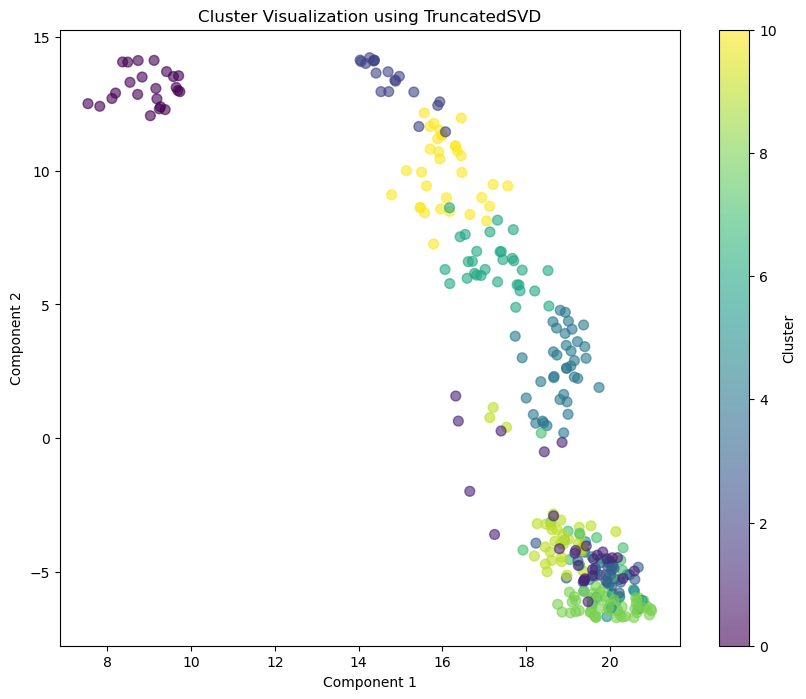

In [15]:
# Create a scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(X_svd[:, 0], X_svd[:, 1], c=cluster_labels, cmap='viridis', s=50, alpha=0.6)
plt.title('Cluster Visualization using TruncatedSVD')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.colorbar(label='Cluster')
plt.show()

In [9]:
# df = clustered_aggregated_df
# # display(df)


# # Define the column range
# start_col = 592
# end_col = 719

# # List of unique clusters
# clusters = df['Cluster'].unique()

# # Define colors for features
# colors = plt.cm.tab20(np.linspace(0, 1, (end_col - start_col + 1) // 2))

# # Plotting dot plots for each cluster including target values with different markers
# for cluster in clusters:
#     plt.figure(figsize=(15, 8))
#     cluster_data = df[df['Cluster'] == cluster]
    
#     for i in range(start_col, end_col + 1, 2):
#         col_pair = cluster_data.iloc[:, i:i+2]
#         plt.scatter(cluster_data.index, col_pair.iloc[:, 0], c=[colors[(i - start_col) // 2]], label=col_pair.columns[0], alpha=0.6)
#         if i + 1 <= end_col:
#             plt.scatter(cluster_data.index, col_pair.iloc[:, 1], c=[colors[(i - start_col) // 2]], label=col_pair.columns[1], alpha=0.6)
    
#     # Plot target values with different markers
#     plt.scatter(cluster_data.index, cluster_data['if_parts_replaced_in_1th_15d'], c='black', marker='o', facecolors='none', label='if_parts_replaced_in_1th_15d')
#     plt.scatter(cluster_data.index, cluster_data['if_parts_replaced_in_2nd_15d'], c='red', marker='x', label='if_parts_replaced_in_2nd_15d')
    
#     plt.title(f'Dot Plot for Cluster {cluster}')
#     plt.xlabel('VIN Index')
#     plt.ylabel('Value')
#     plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
#     plt.grid(True)
#     plt.show()


# Display pattern of aggregated DTCs within the aggregated data for VINs per cluster (classified data for VINs based on KOLA build options)

/tmp/ipykernel_2043116/3200080801.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot(features_1, vin_data[features_1], color=colors[idx], label=f'VIN {vin} - Features 1')
/tmp/ipykernel_2043116/3200080801.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.scatter([target_1], vin_data[target_1], color=colors[idx], marker='o', facecolors='none')
/tmp/ipykernel_2043116/3200080801.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser

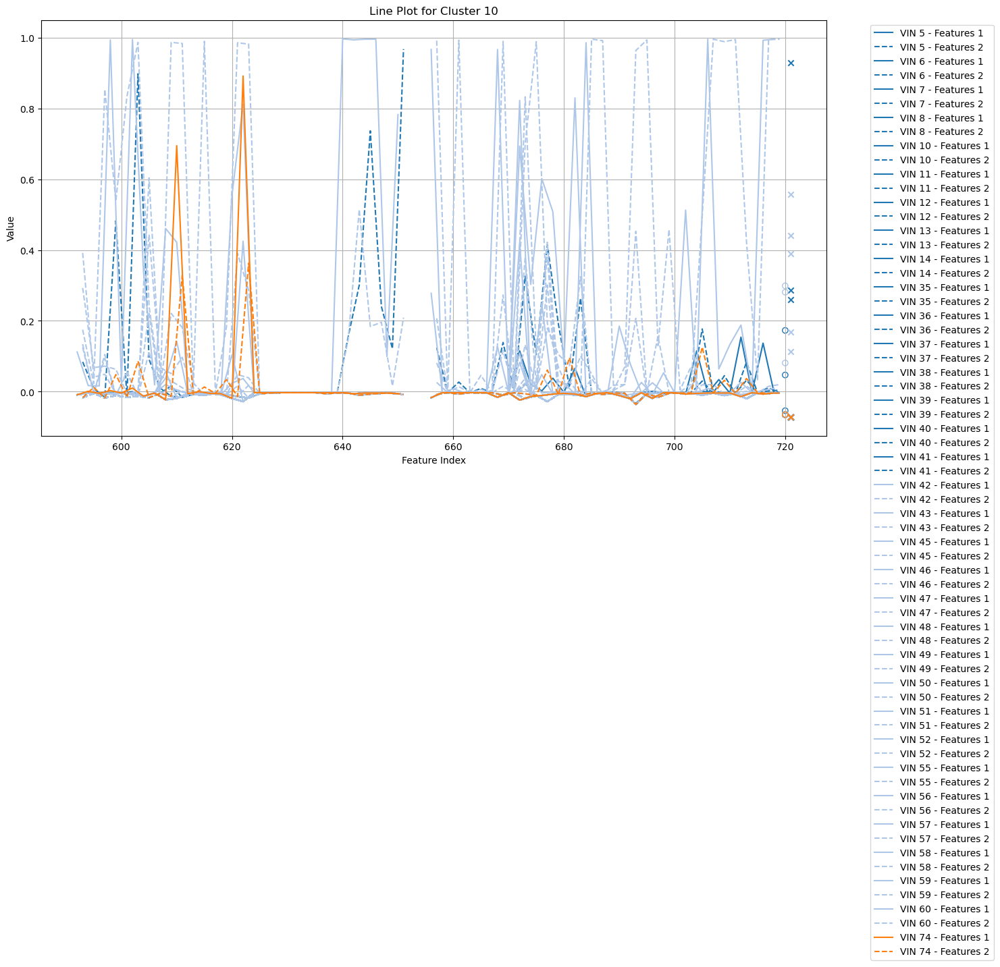

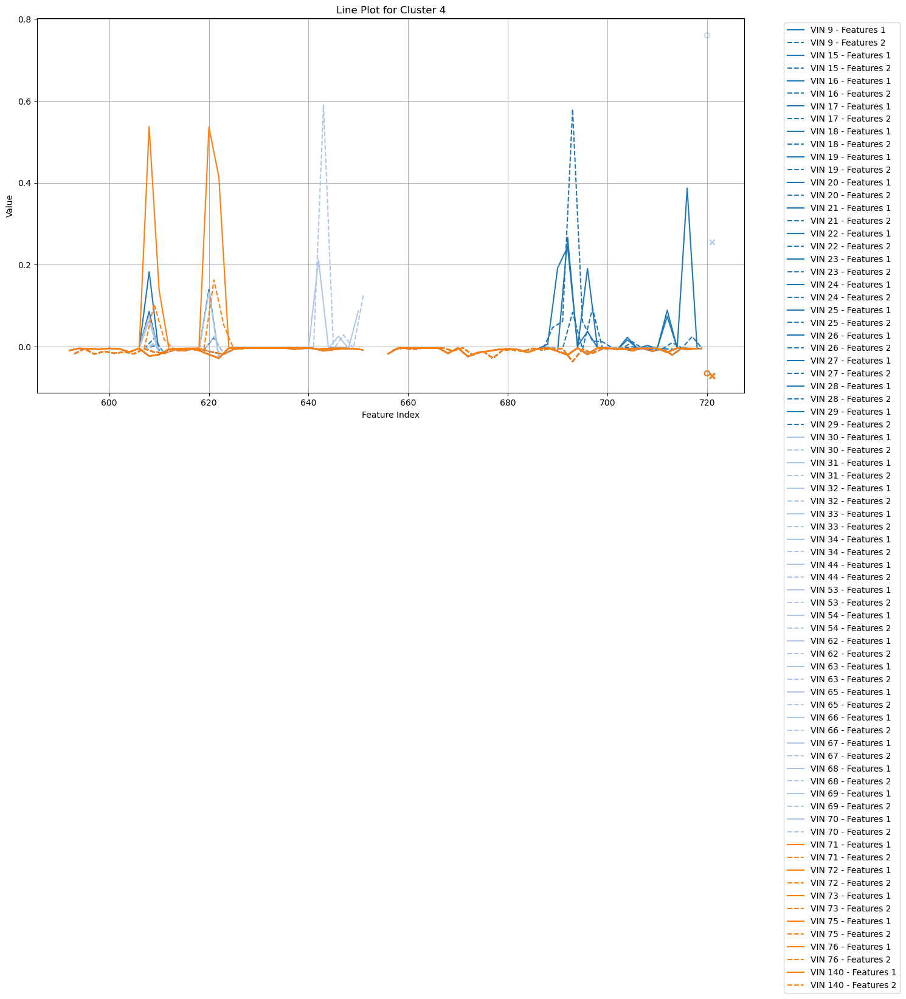

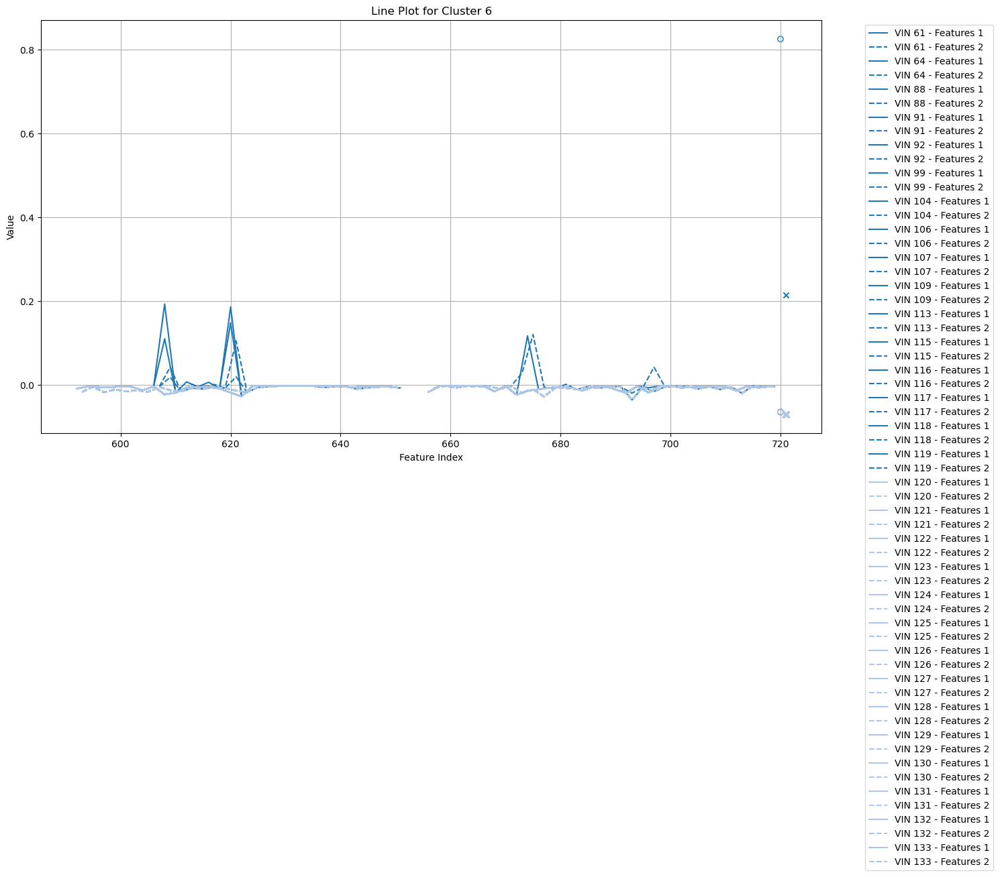

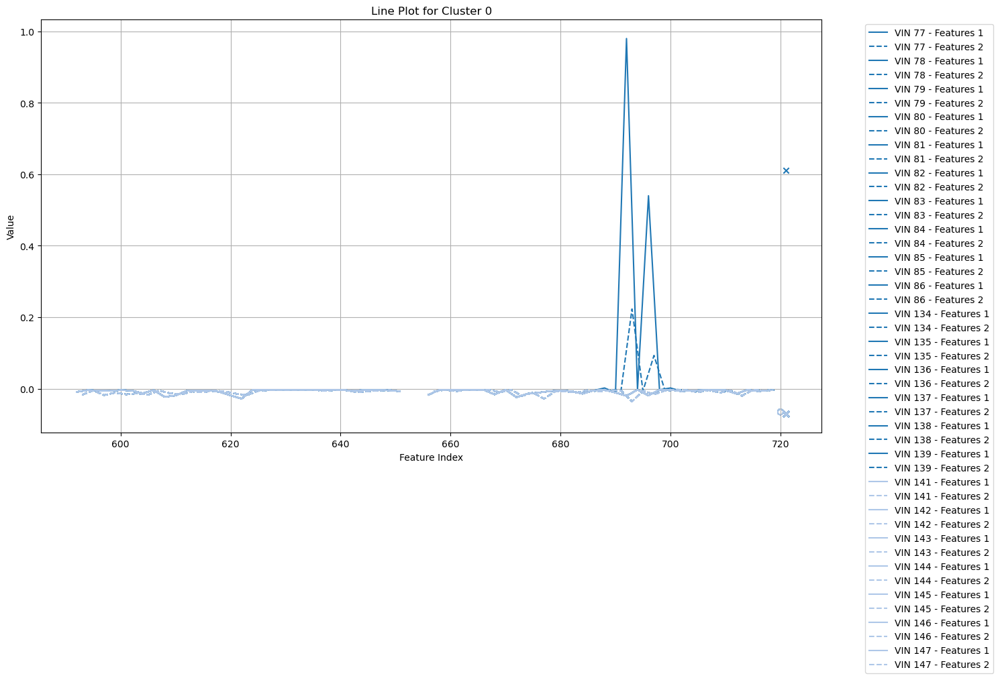

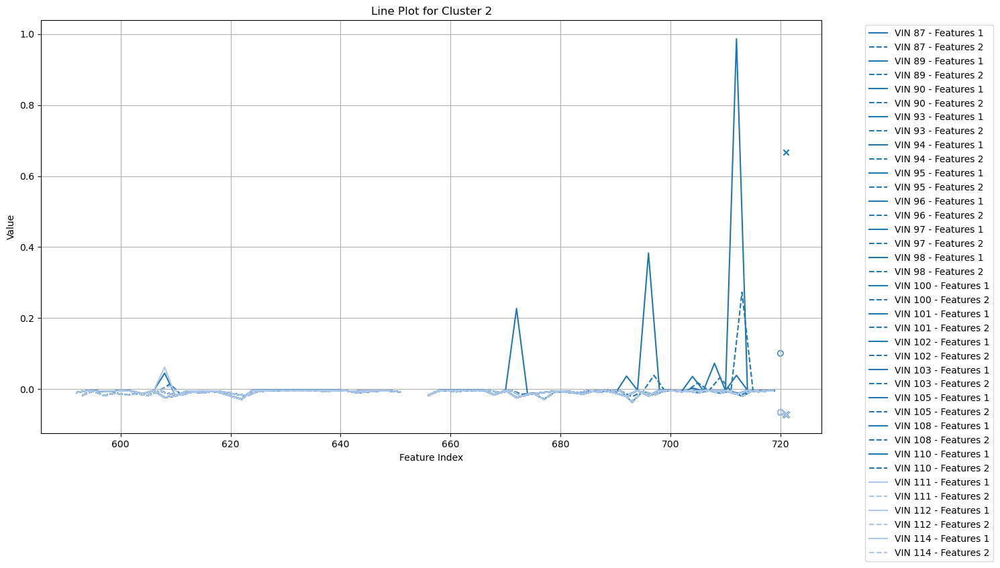

...

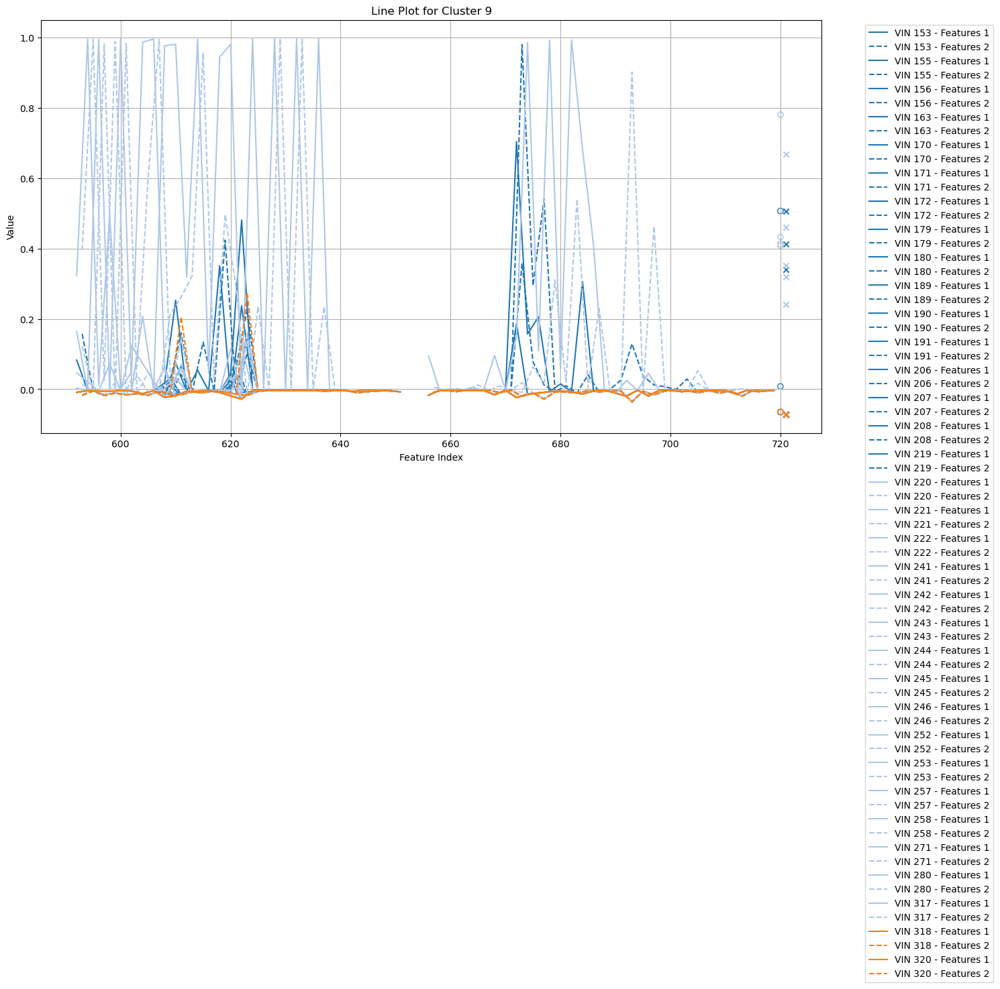

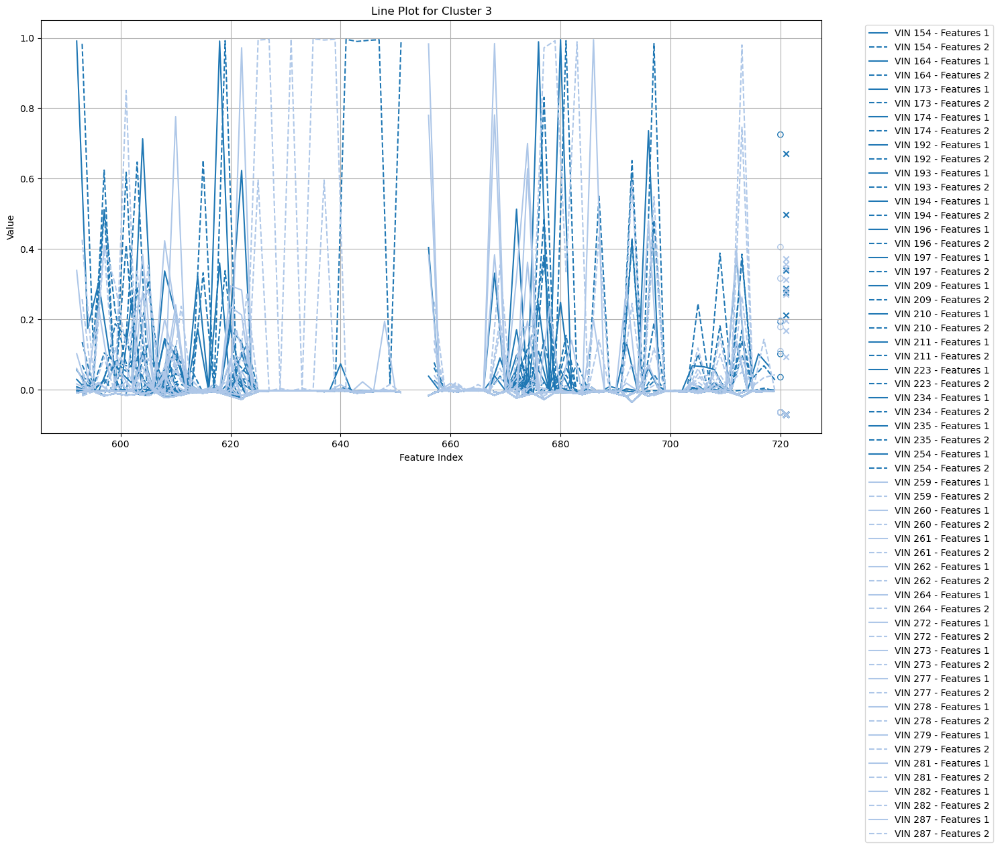

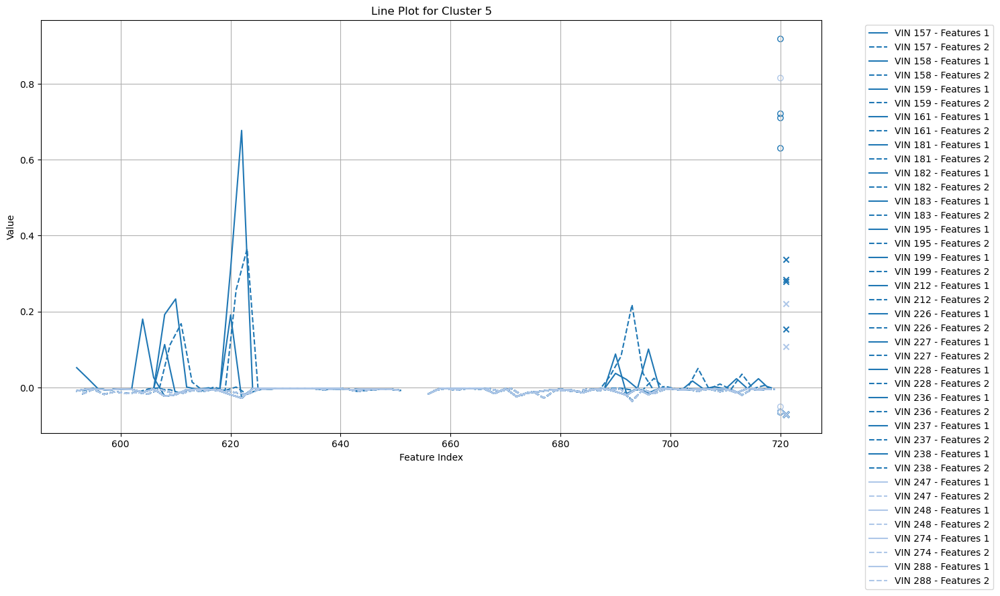

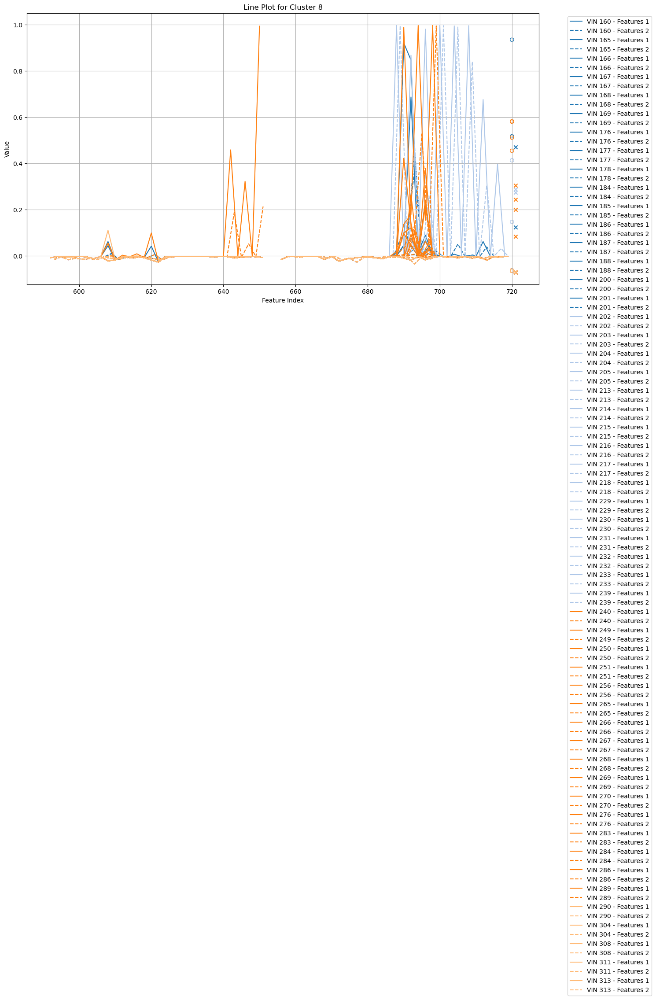

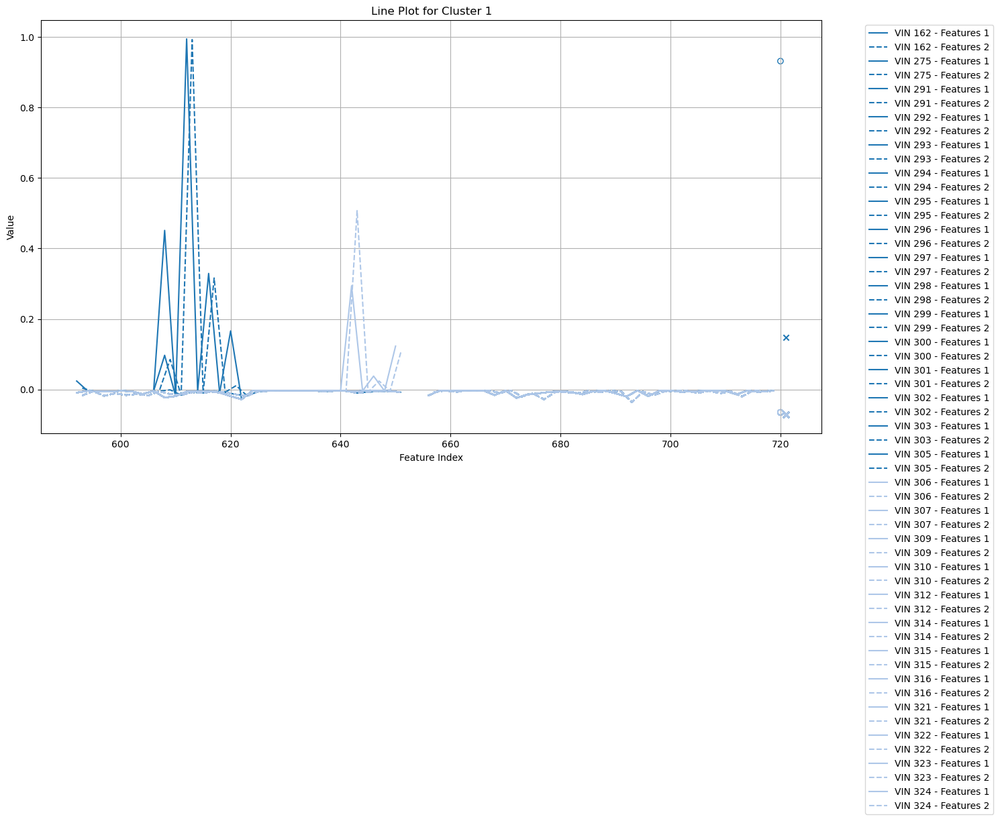

In [16]:
df = clustered_aggregated_df

# Define the column ranges for the two plots
features_1 = list(range(592, 719, 2))
features_2 = list(range(593, 720, 2))
target_1 = 720
target_2 = 721

# List of unique clusters
clusters = df['Cluster'].unique()

# Define colors
colors = plt.cm.tab20(np.linspace(0, 1, len(df)))

# Plotting line plots for each VIN in each cluster
for cluster in clusters:
    plt.figure(figsize=(15, 8))
    cluster_data = df[df['Cluster'] == cluster]
    
    for idx, vin in enumerate(cluster_data.index):
        vin_data = cluster_data.loc[vin]
        
        # First plot
        plt.plot(features_1, vin_data[features_1], color=colors[idx], label=f'VIN {vin} - Features 1')
        plt.scatter([target_1], vin_data[target_1], color=colors[idx], marker='o', facecolors='none')
        
        # Second plot
        plt.plot(features_2, vin_data[features_2], color=colors[idx], linestyle='--', label=f'VIN {vin} - Features 2')
        plt.scatter([target_2], vin_data[target_2], color=colors[idx], marker='x')
    
    plt.title(f'Line Plot for Cluster {cluster}')
    plt.xlabel('Feature Index')
    plt.ylabel('Value')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()


# Display pattern of aggregated DTCs vs part_replacements (target values) within the aggregated data for VINs per cluster (classified data for VINs based on KOLA build options)

,VIN,ENGINE_SIZE,ENGINE_HP,VEH_TYPE,_KOLA_01X,_KOLA_02X,_KOLA_03X,_KOLA_04X,_KOLA_05X,_KOLA_06X,...,f_5_dtc2457_2nd_15d,f_6_dtc2457_1th_15d,f_6_dtc2457_2nd_15d,f_7_dtc2457_1th_15d,f_7_dtc2457_2nd_15d,f_8_dtc2457_1th_15d,f_8_dtc2457_2nd_15d,if_parts_replaced_in_1th_15d,if_parts_replaced_in_2nd_15d,Cluster
5,1M1AN07Y0GM024805,D13,500,CHU,WTDF24.5,WTDD24.5,?,WBF-ALCO,WBD-ALCO,?,...,0.032,-0.003,-0.003,-0.007,0.002,-0.004,0.004,-0.054,0.260,10
6,1M1AN07Y1GM023176,D13,500,CHU,WTDF24.5,WTDD24.5,?,WBF-ALCO,WBD-ALCO,?,...,0.083,-0.003,-0.003,0.137,0.011,-0.004,-0.004,-0.065,-0.071,10
7,1M1AN07Y2FM018065,D13,445,CHU,WTDF24.5,WTDD24.5,?,WBF-ALCO,WBD-ALCO,?,...,-0.020,-0.003,-0.003,-0.007,-0.005,-0.004,-0.004,-0.065,-0.071,10
8,1M1AN07Y3FM018057,D13,500,CHU,WTDF22.5,WTDD22.5,?,WBF-ALCO,WBD-ALCO,?,...,-0.020,-0.003,-0.003,-0.007,-0.005,-0.004,-0.004,-0.065,-0.071,10
9,1M1AN07Y6KM028527,D13,445,CHU,WTDF24.5,WTDD24.5,UWTDT,WBF-ALCO,WBD-HL,UWBT,...,-0.020,-0.003,-0.003,-0.007,-0.005,-0.004,-0.004,-0.065,-0.071,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320,4V5KC9EJ3FN179541,D13,500,NC,WTDF22.5,WTDD24.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,-0.020,-0.003,-0.003,-0.007,-0.005,-0.004,-0.004,-0.065,-0.071,9
321,4V5KG9EJ3MN278653,D13,500,NC,WTDF22.5,WTDD22.5,WTDT22.5,WBF-ACCU,WBD-ACCU,WBT-ACCU,...,-0.020,-0.003,-0.003,-0.007,-0.005,-0.004,-0.004,-0.065,-0.071,1
322,4V5KJ9EH6MN277057,D13,435,NC,WTDF22.5,WTDD24.5,WTDT22.5,WBF-ACCU,WBD-ACCU,WBT-ACCU,...,-0.020,-0.003,-0.003,-0.007,-0.005,-0.004,-0.004,-0.065,-0.071,1
323,4V5RC9EH8KN200468,D13,455,VAH,WTDF22.5,WTDD22.5,UWTDT,WBF-ALCO,WBD-ALCO,UWBT,...,-0.020,-0.003,-0.003,-0.007,-0.005,-0.004,-0.004,-0.065,-0.071,1


/tmp/ipykernel_2043116/1445423361.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot(features_1, vin_data[features_1], color=colors[idx], label=f'VIN {vin} - Features 1')
/tmp/ipykernel_2043116/1445423361.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot(features_2, vin_data[features_2], color=colors[idx], linestyle='--', label=f'VIN {vin} - Features 2')


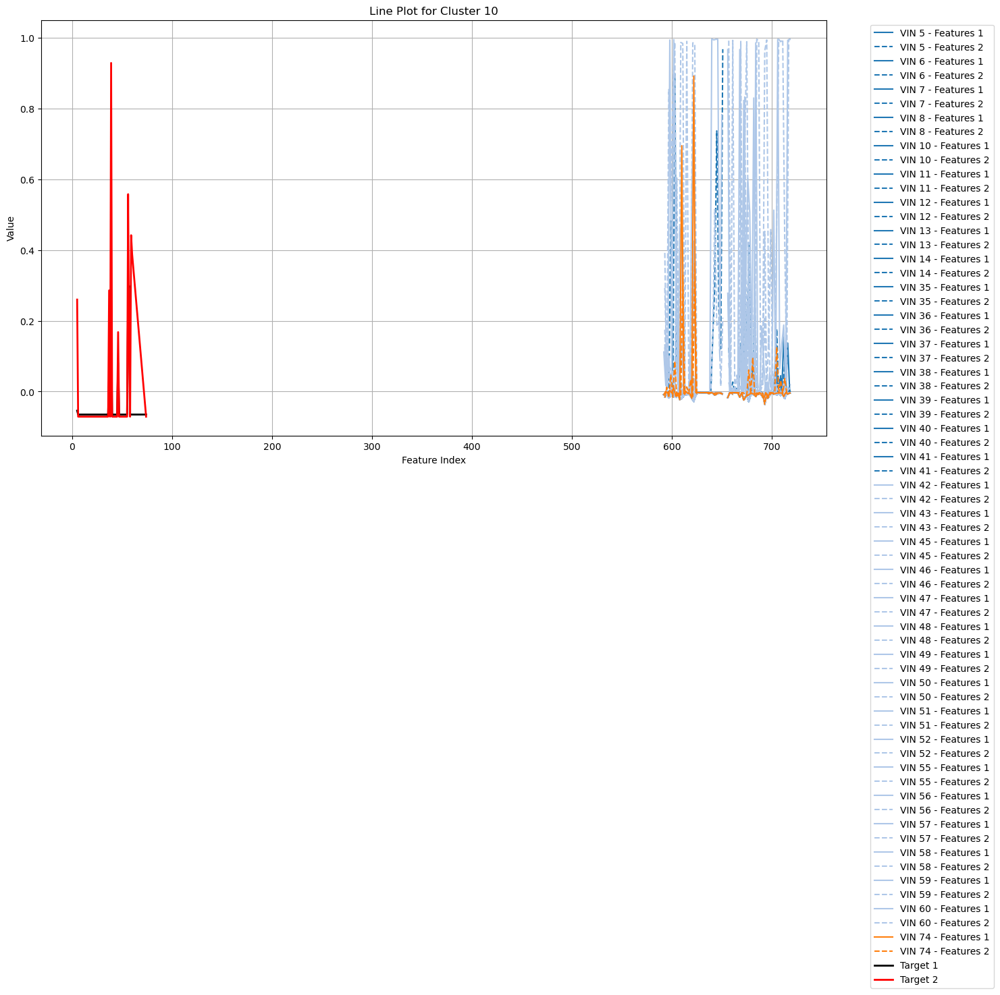

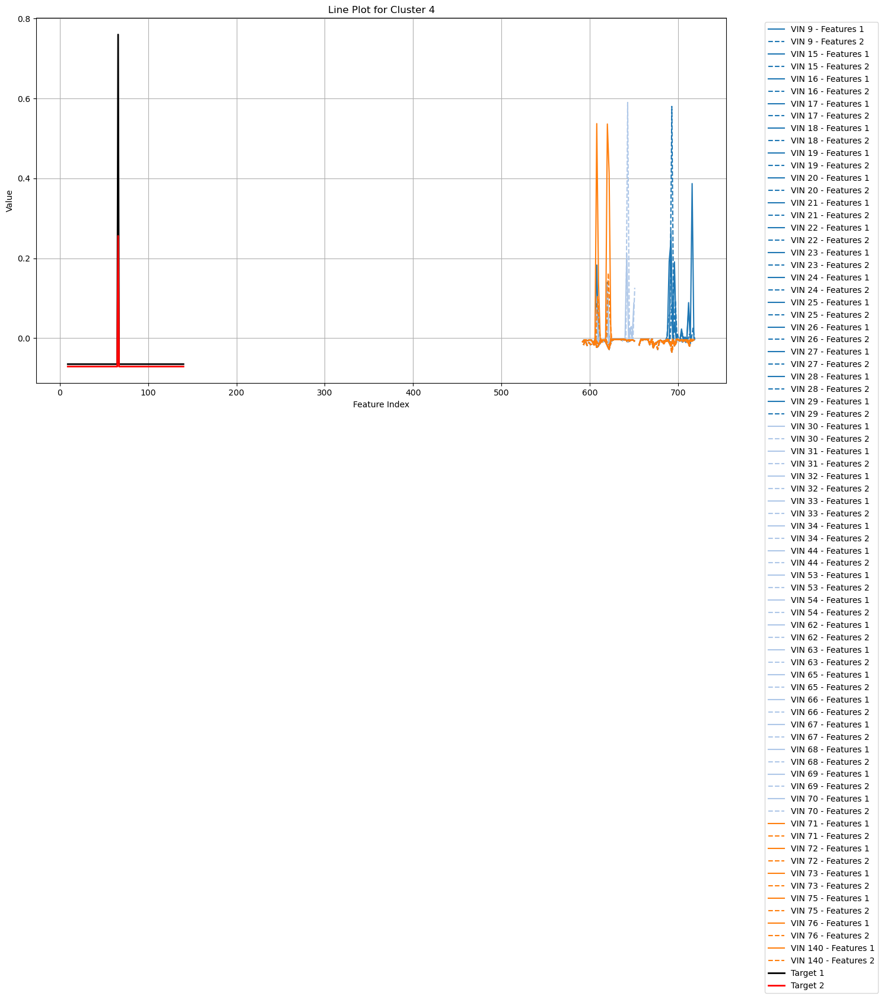

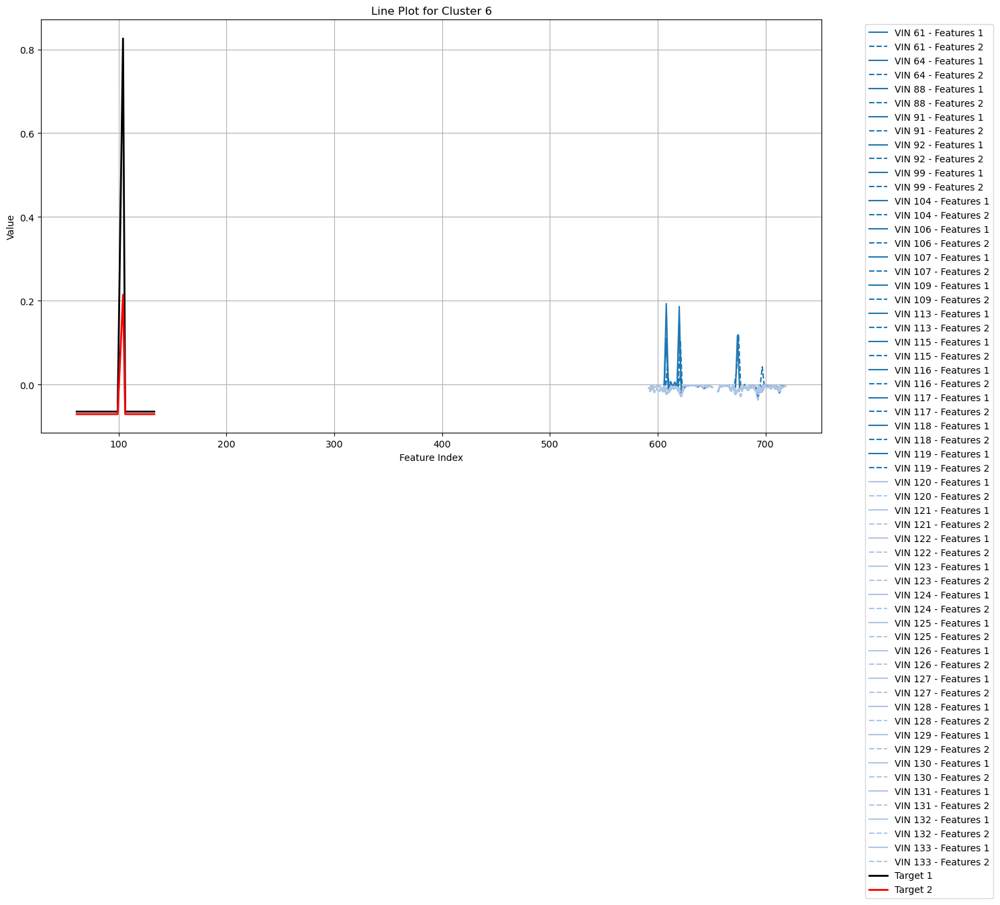

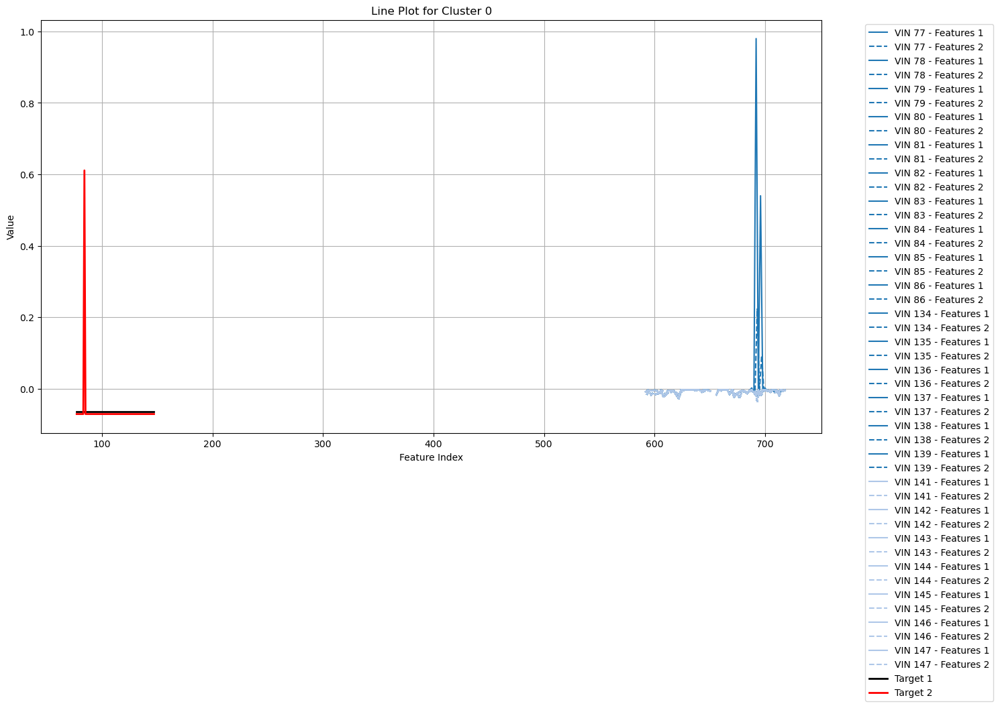

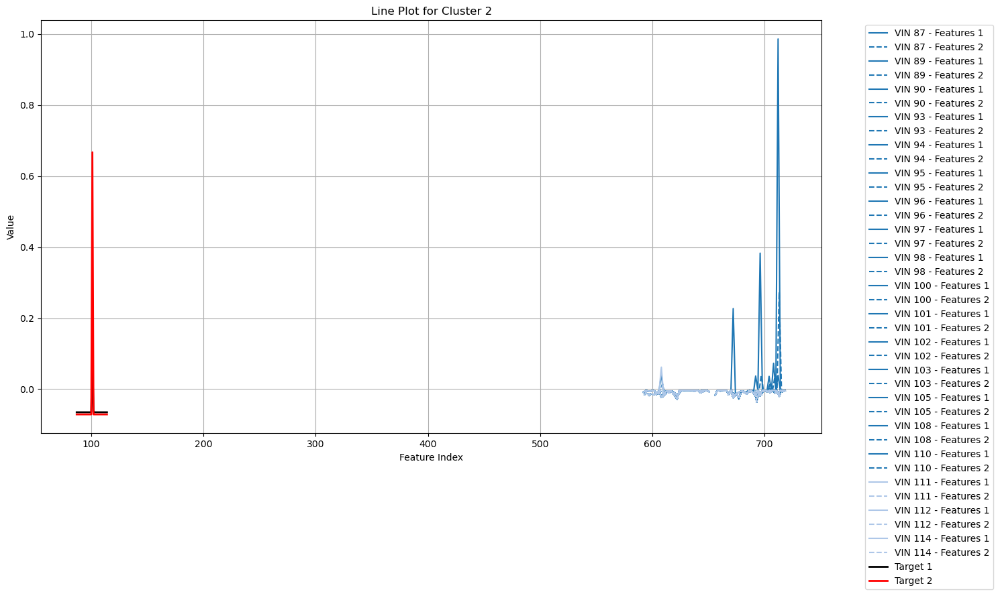

...

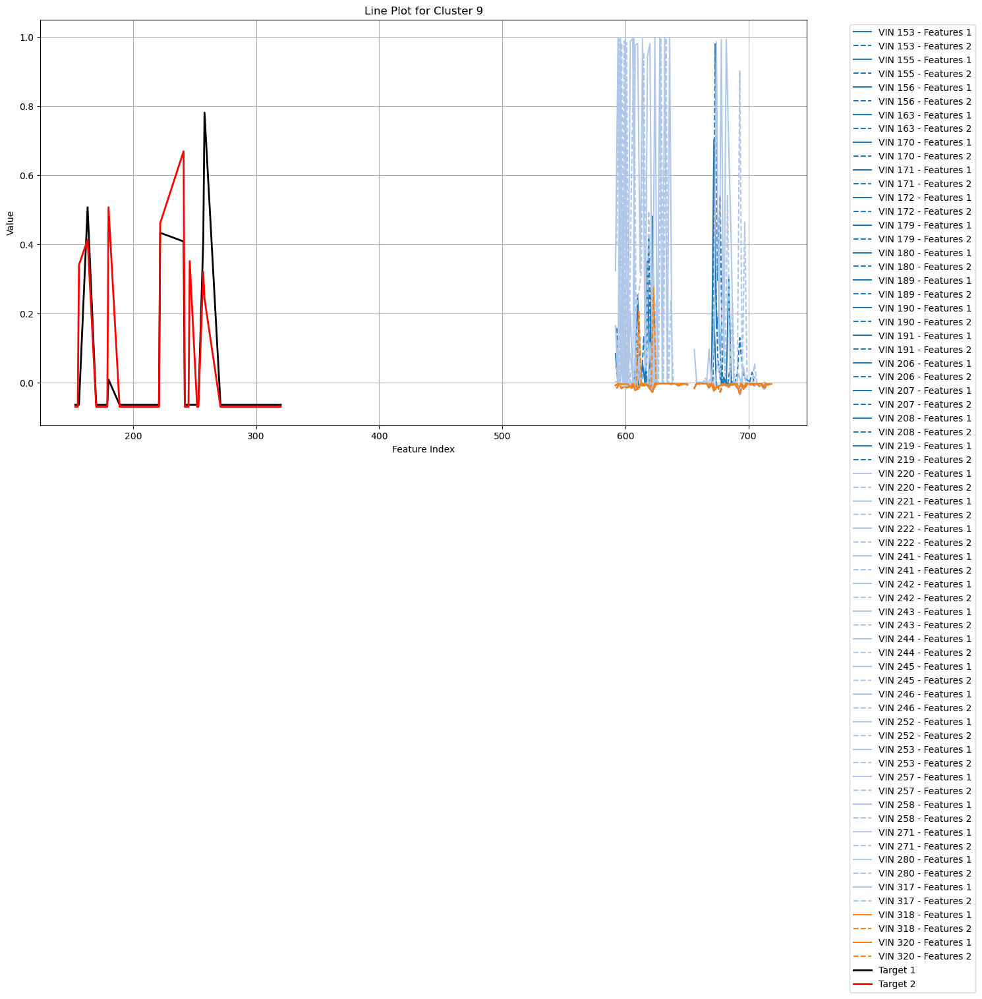

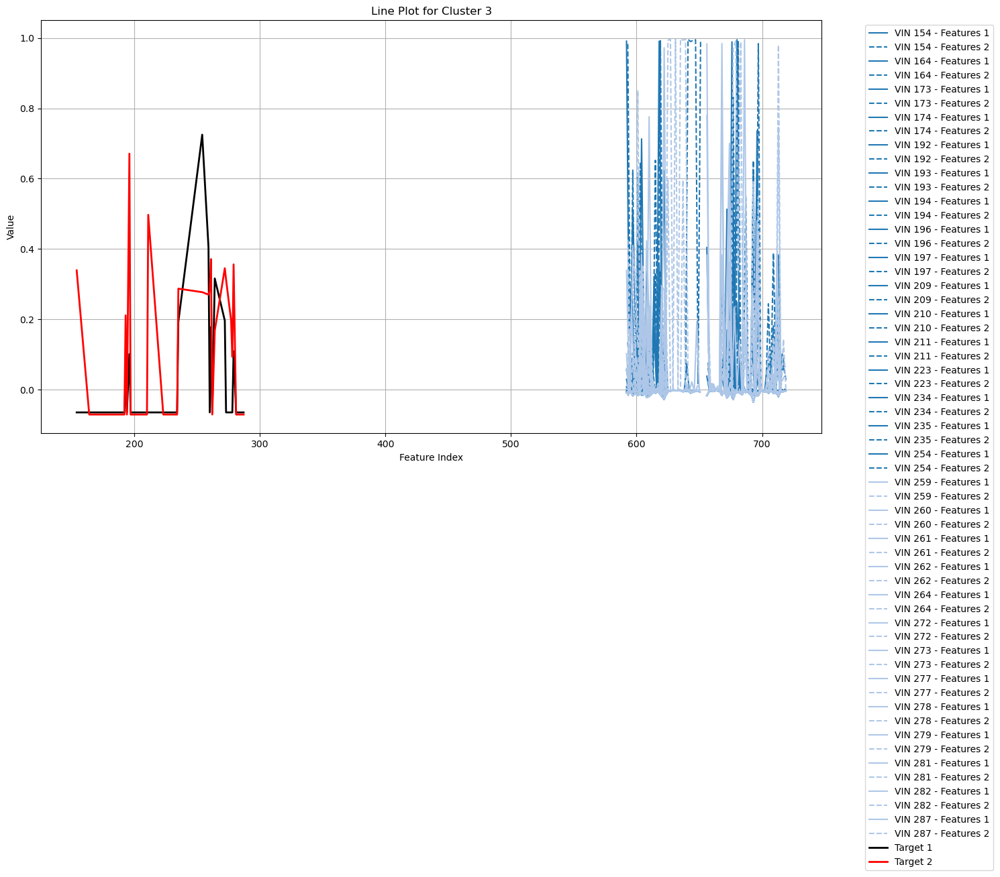

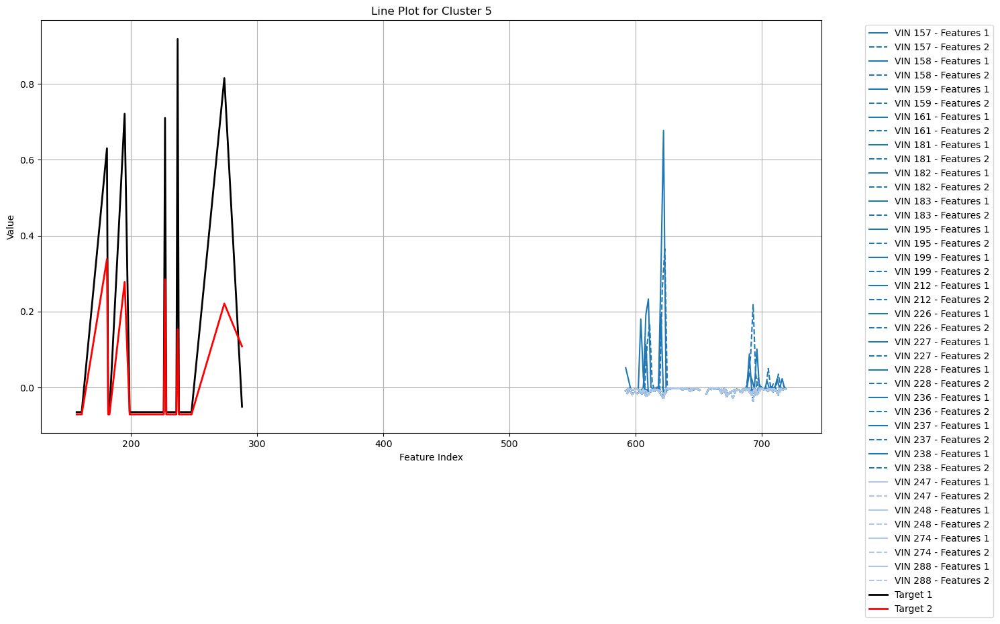

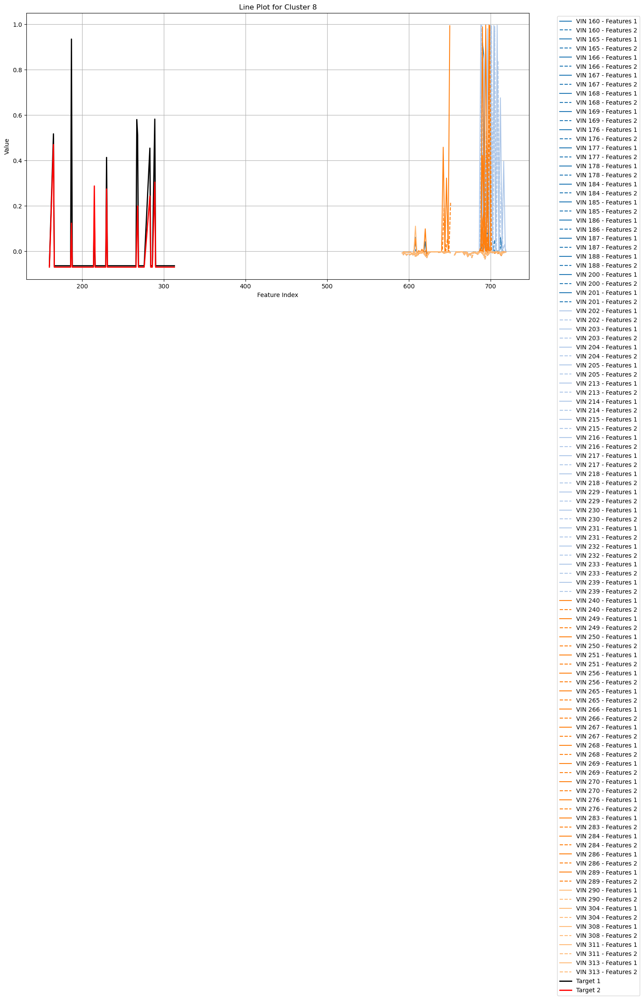

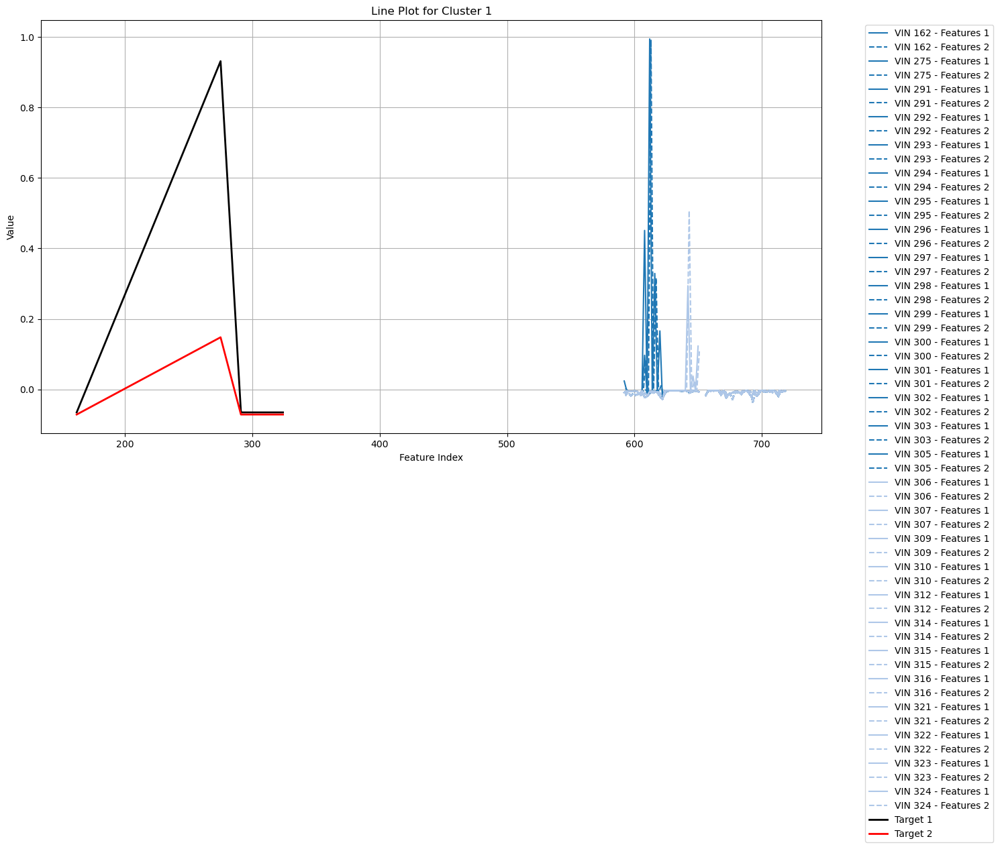

In [17]:
df = clustered_aggregated_df

# Cleaning non-numeric chunk of the dataframe
selected_numeric_features_for_this_VIN = [s for s in df.columns if '_dtc' in s or '_parts' in s]

# Normalizing numeric chunk
# df[selected_numeric_features_for_this_VIN] = normalize_sparse_dataframe(df[selected_numeric_features_for_this_VIN], "calendar_day")
# df[selected_numeric_features_for_this_VIN] = normalize_numeric_feature_values('_dtc', df)

df[selected_numeric_features_for_this_VIN] = df[selected_numeric_features_for_this_VIN].apply(lambda iterator: ((iterator - iterator.mean())/(iterator.max() - iterator.min())).round(3))

display(df)
# Save the dataframe with cluster labels
df.to_csv('/storage/home/yqf5148/work/volvoPennState/data/dataset/normalized_clustered_aggregated_df.csv', index = None, mode = 'w', header=False)
# Define the column ranges for the two plots
features_1 = list(range(592, 719, 2))
features_2 = list(range(593, 720, 2))
target_1 = 'if_parts_replaced_in_1th_15d'
target_2 = 'if_parts_replaced_in_2nd_15d'

# List of unique clusters
clusters = df['Cluster'].unique()

# Define colors for features
colors = plt.cm.tab20(np.linspace(0, 1, len(df)))

# Plotting line plots for each VIN in each cluster and the target values
for cluster in clusters:
    plt.figure(figsize=(15, 8))
    cluster_data = df[df['Cluster'] == cluster]
    
    for idx, vin in enumerate(cluster_data.index):
        vin_data = cluster_data.loc[vin]
        
        # First plot for features
        plt.plot(features_1, vin_data[features_1], color=colors[idx], label=f'VIN {vin} - Features 1')
        
        # Second plot for features
        plt.plot(features_2, vin_data[features_2], color=colors[idx], linestyle='--', label=f'VIN {vin} - Features 2')
    
    # Plot target values for the cluster
    plt.plot(cluster_data.index, cluster_data[target_1], 'k-', label='Target 1', linewidth=2)
    plt.plot(cluster_data.index, cluster_data[target_2], 'r-', label='Target 2', linewidth=2)
    
    plt.title(f'Line Plot for Cluster {cluster}')
    plt.xlabel('Feature Index')
    plt.ylabel('Value')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()


/tmp/ipykernel_2043116/247388612.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot(features_1, vin_data[features_1], color=colors[idx], label=f'VIN {vin} - Features 1')
/tmp/ipykernel_2043116/247388612.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot(features_2, vin_data[features_2], color=colors[idx], linestyle='--', label=f'VIN {vin} - Features 2')


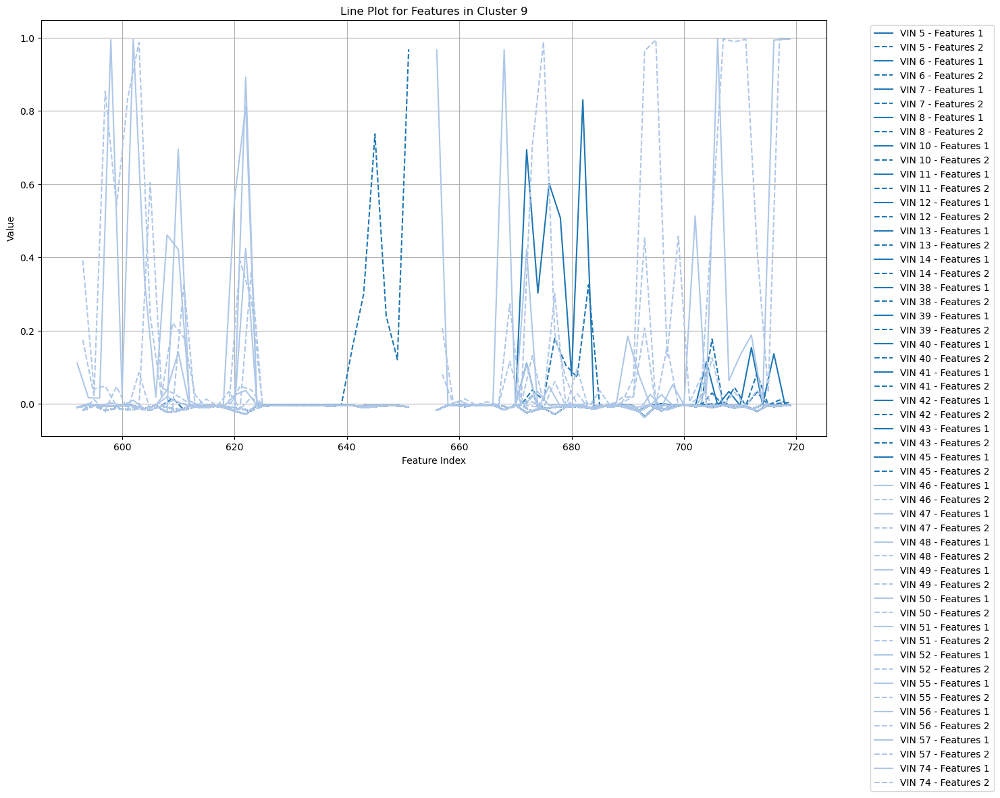

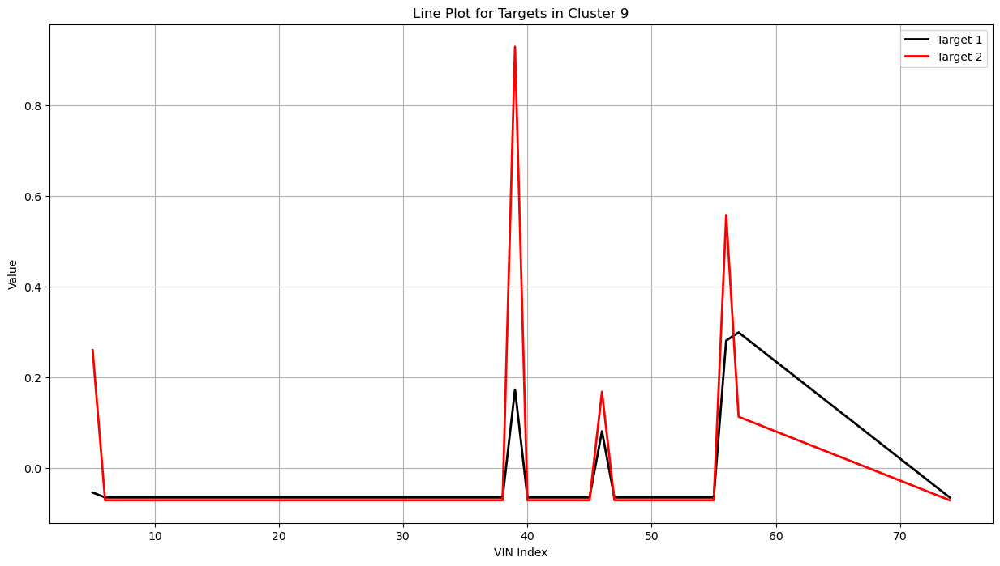

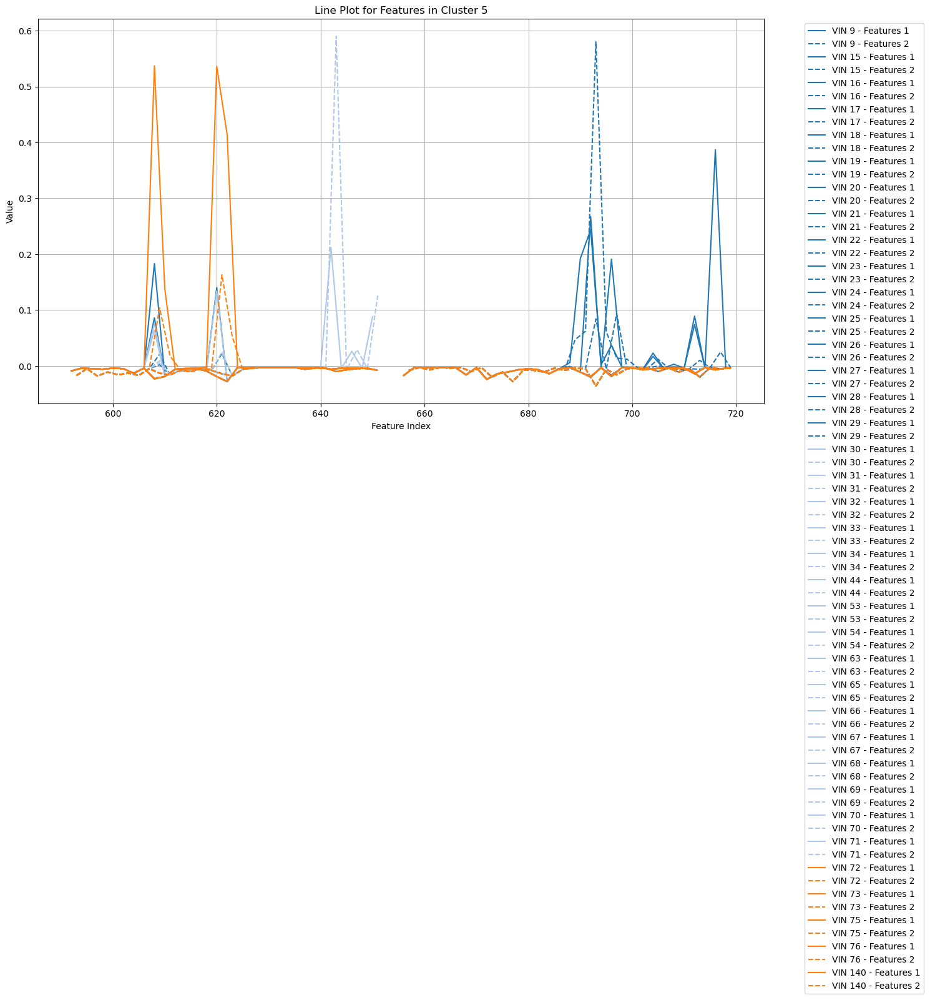

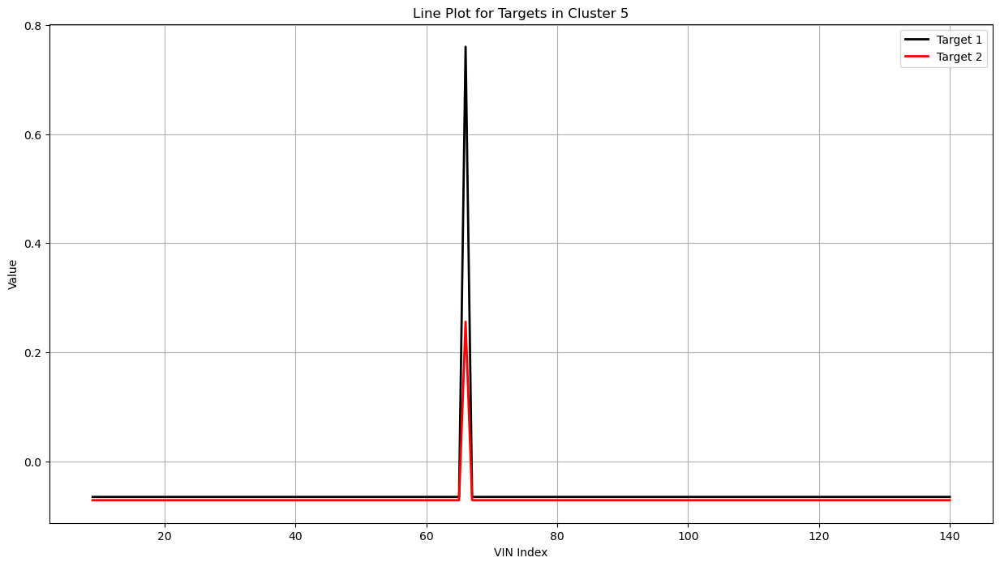

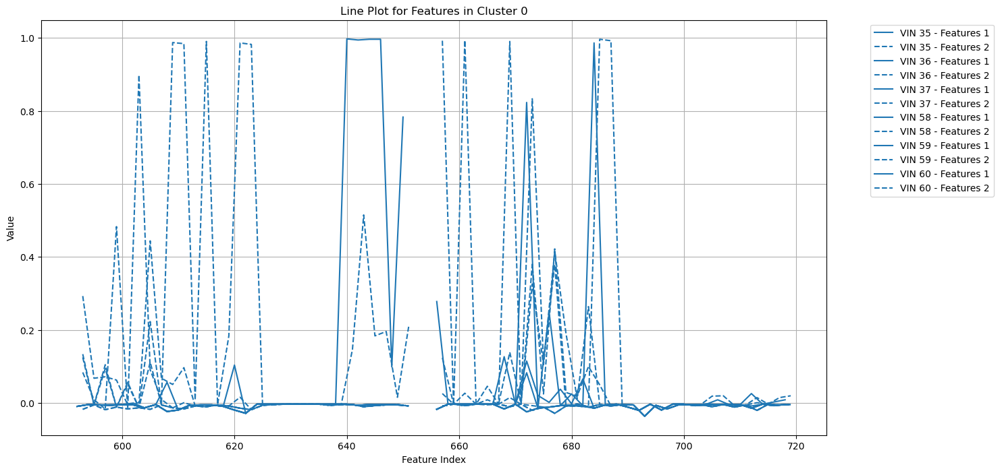

...

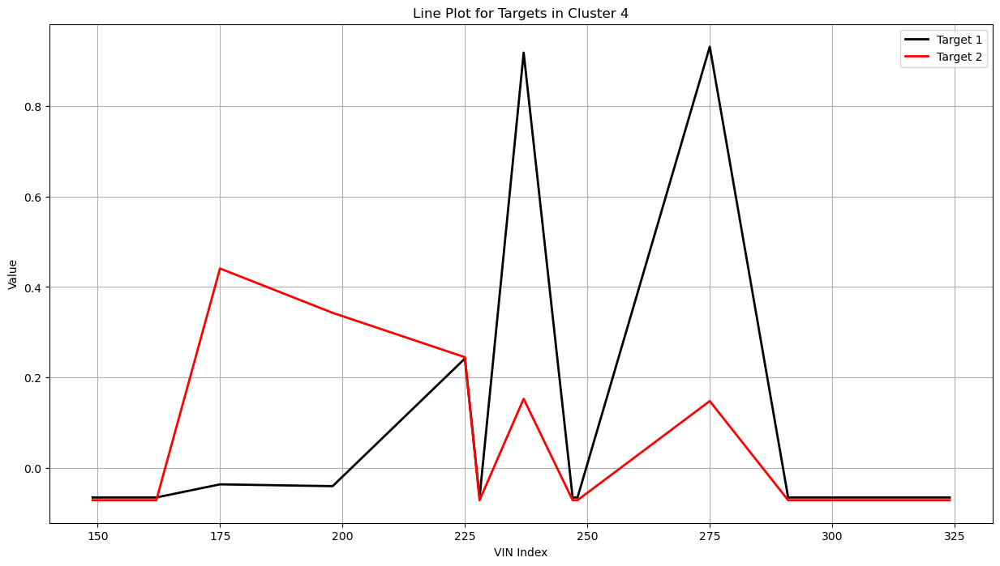

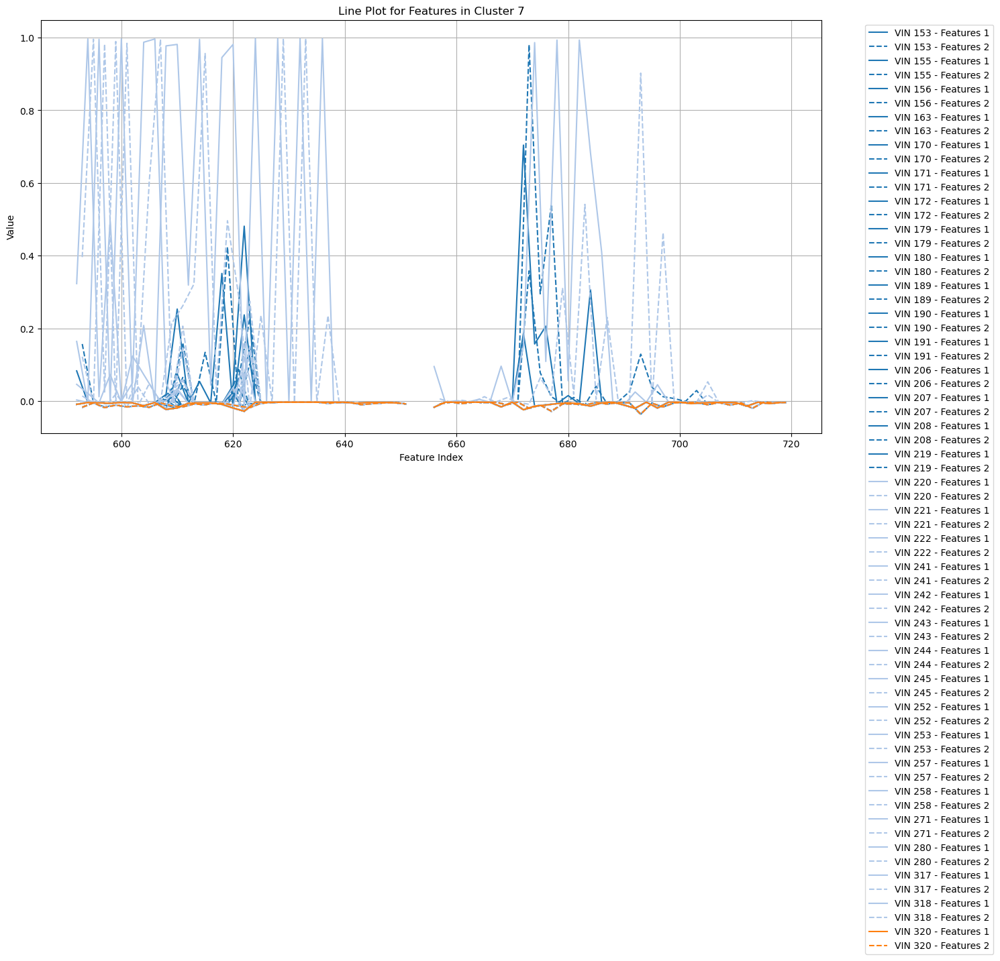

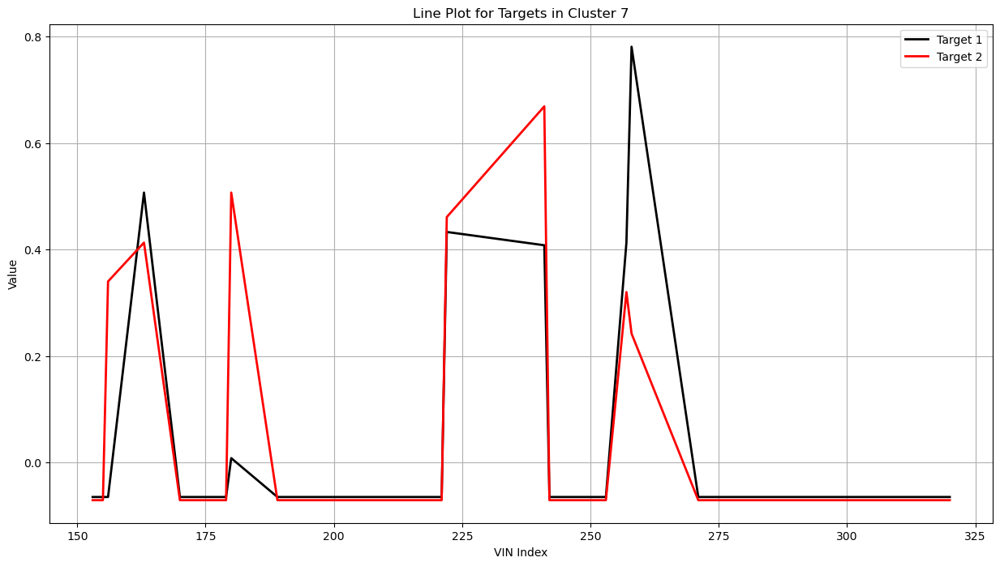

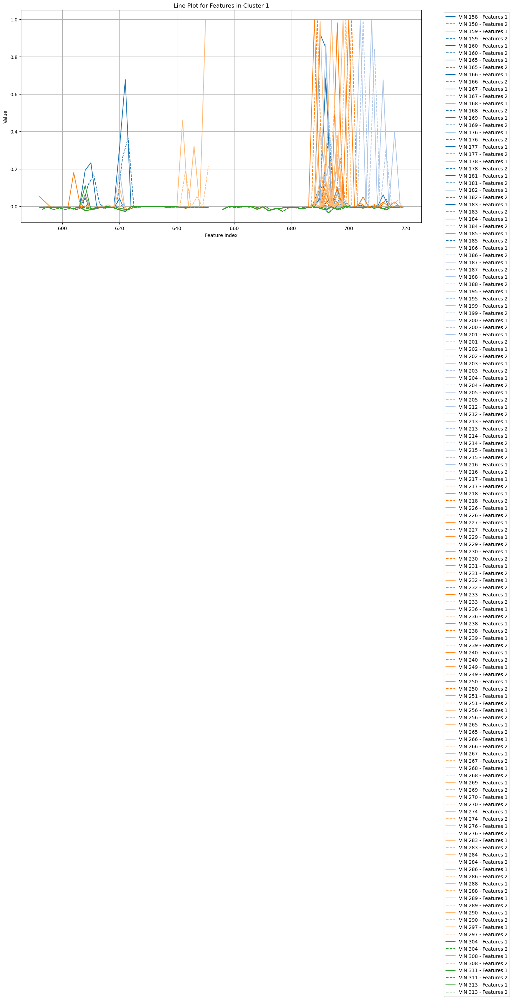

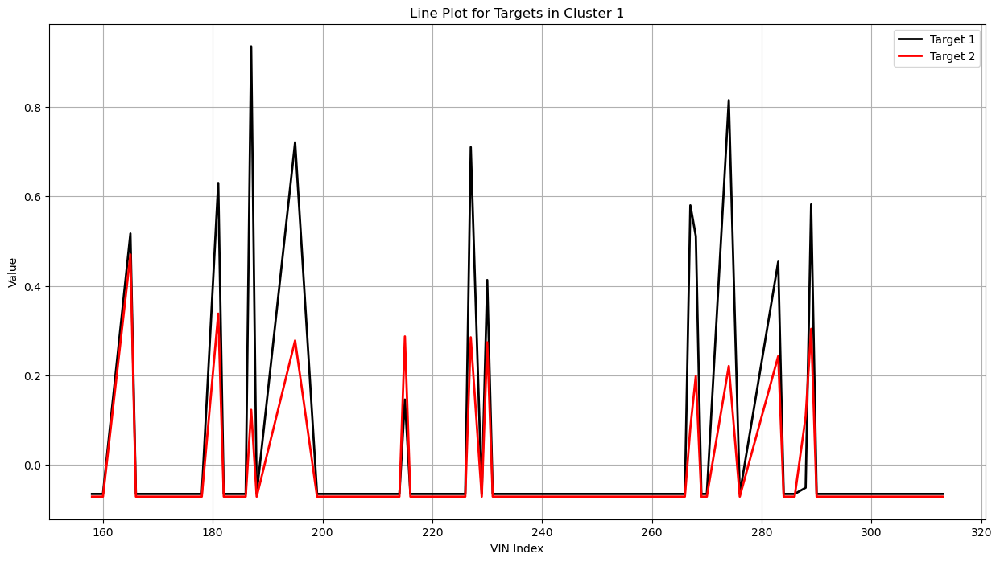

In [12]:
df = clustered_aggregated_df

# Define the column ranges for the two plots
features_1 = list(range(592, 719, 2))
features_2 = list(range(593, 720, 2))
target_1 = 'if_parts_replaced_in_1th_15d'
target_2 = 'if_parts_replaced_in_2nd_15d'

# List of unique clusters
clusters = df['Cluster'].unique()

# Define colors for features
colors = plt.cm.tab20(np.linspace(0, 1, len(df)))

# Plotting line plots for each VIN in each cluster and the target values
for cluster in clusters:
    # Plot features for each VIN in the cluster
    plt.figure(figsize=(15, 8))
    cluster_data = df[df['Cluster'] == cluster]
    
    for idx, vin in enumerate(cluster_data.index):
        vin_data = cluster_data.loc[vin]
        
        # First plot for features
        plt.plot(features_1, vin_data[features_1], color=colors[idx], label=f'VIN {vin} - Features 1')
        
        # Second plot for features
        plt.plot(features_2, vin_data[features_2], color=colors[idx], linestyle='--', label=f'VIN {vin} - Features 2')
    
    plt.title(f'Line Plot for Features in Cluster {cluster}')
    plt.xlabel('Feature Index')
    plt.ylabel('Value')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()
    
    # Plot target values for the cluster
    plt.figure(figsize=(15, 8))
    plt.plot(cluster_data.index, cluster_data[target_1], 'k-', label='Target 1', linewidth=2)
    plt.plot(cluster_data.index, cluster_data[target_2], 'r-', label='Target 2', linewidth=2)
    
    plt.title(f'Line Plot for Targets in Cluster {cluster}')
    plt.xlabel('VIN Index')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()
